# **Activity:** Assignment 9.1 : Convolutional Neural Network

# **Name:** Raven Charles Roy P. Jacinto

# **Course and Section:** CPE019 - CPE32S3

# **Date of Submission:** April 27, 2024

# **Instructor:** Engr. Roman Richard



## **Instructions**

- **Choose any dataset applicable to an image classification problem**
- **Explain your datasets and the problem being addressed.**
- **Show evidence that you can do the following:**
- - Using your dataset, create a baseline model of the CNN
- - Perform image augmentation
- - Perform feature standardization
- - Perform ZCA whitening of your images
- - Augment data with random rotations, shifts, and flips
- - Save augmented image data to disk
- - Develop a test harness to develop a robust evaluation of a model and establish a baseline of performance for a classification task
- - Explore extensions to a baseline model to improve learning and model capacity.
- - Develop a finalized model, evaluate the performance of the final model, and use it to make predictions on new images.

## **Dataset Explanation and problem being addressed**

### This dataset is from kaggle and it has two folders inside namely Training and Testing which includes different pictures of crows, bears, elephants, and rats separated in each specific folder. This dataset I got from kaggle has its own partition when it comes to train and test data. That is why I did not do the splitting for this dataset.


### The problem being addressed here is a prediction of multiple classification. It is used to predict the animal shown in the picture or in the sample, which can be a help in developing computer vision projects and tasks. This dataset is being processed and used in convolution nueral network model in this activity.

Dataset Link: https://www.kaggle.com/datasets/ikjotsingh221/animal-dataset

In [ ]:
# For storing dataset in drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Loading, Data Checking, and Pre-processing**

In [ ]:
# Loading the dataset

dataset_path = '/content/drive/MyDrive/DatasetFor9.1/A9.1'

In [ ]:
# Preprocessing (Reshaping images, turning classmode to categorical)

import os
import cv2

# Function to reshape images
def reshape_images(directory, target_shape=(224, 224)):
    for animal_folder in os.listdir(directory):
        # Check if the item is a directory
        if os.path.isdir(os.path.join(directory, animal_folder)):
            for root, dirs, files in os.walk(os.path.join(directory, animal_folder)):
                for file in files:
                    # Check if the file is an image
                    if file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith(".png"):
                        image_path = os.path.join(root, file)
                        # Read the image
                        image = cv2.imread(image_path)
                        # Resize the image
                        resized_image = cv2.resize(image, (target_shape[1], target_shape[0]))
                        # Check if the image has 3 channels (RGB)
                        if resized_image.shape[2] == 3:
                            # Overwrite the original image with the resized image
                            cv2.imwrite(image_path, resized_image)
                        else:
                            print(f"Skipping {image_path} as it does not have 3 channels (RGB)")

# Directory containing the images
dataset_path = "/content/drive/MyDrive/DatasetFor9.1/A9.1"

# Reshape images in the Training folder
reshape_images(os.path.join(dataset_path, "Training"))

# Reshape images in the Testing folder
reshape_images(os.path.join(dataset_path, "Testing"))


In [ ]:
from PIL import Image
import os

image_dir = '/content/drive/MyDrive/DatasetFor9.1/A9.1/Testing/bears/k4 (100).jpeg'

# Loading the image to check its dimensions and channel
image = Image.open(image_dir)
image.show()
print("Image dimensions:", image.size)
print("Image mode:", image.mode)


Image dimensions: (224, 224)
Image mode: RGB


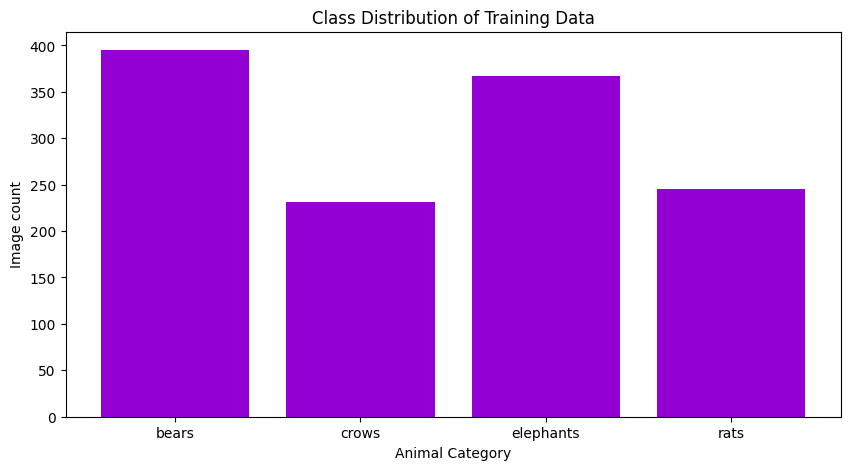

In [ ]:
import os
import matplotlib.pyplot as plt

base_dir = "/content/drive/MyDrive/DatasetFor9.1/A9.1"
weather_categories = ['bears', 'crows', 'elephants', 'rats']

def categorical_image_count(data_dir):
    counts = {}
    for category in weather_categories:
        category_dir = os.path.join(data_dir, category)
        counts[category] = len(os.listdir(category_dir))
    return counts

train_counts = categorical_image_count(os.path.join(base_dir, 'Training'))

# Checking class distribution for training data
plt.figure(figsize=(10, 5))
plt.bar(train_counts.keys(), train_counts.values(), color='darkviolet')
plt.title('Class Distribution of Training Data')
plt.xlabel('Animal Category')
plt.ylabel('Image count')
plt.show()

### **Training Class Distrubtion Evaluation:** The four classes (bears, crows, elephants, and rats) are not equal in amount of images stored in its folder. This may cause data imbalance that may affect my CNN model but I will just try to see the results if they are not balanced.

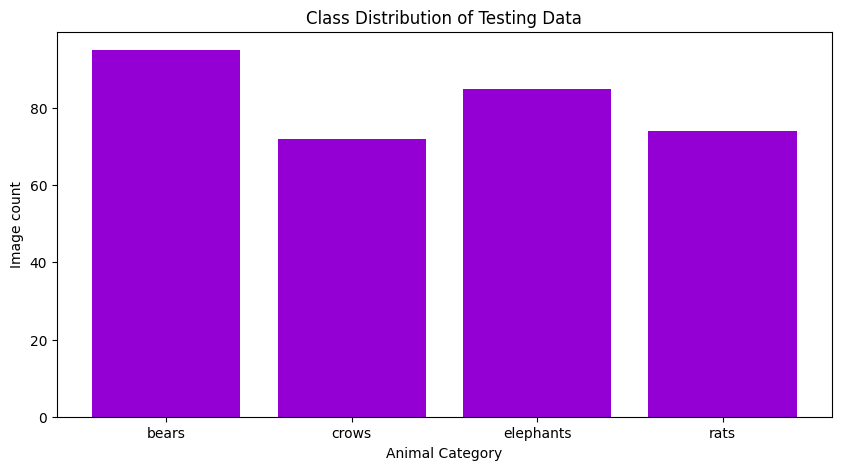

In [ ]:
import os
import matplotlib.pyplot as plt

base_dir = "/content/drive/MyDrive/DatasetFor9.1/A9.1"
weather_categories = ['bears', 'crows', 'elephants', 'rats']

def categorical_image_count(data_dir):
    counts = {}
    for category in weather_categories:
        category_dir = os.path.join(data_dir, category)
        counts[category] = len(os.listdir(category_dir))
    return counts

test_counts = categorical_image_count(os.path.join(base_dir, 'Testing'))

# Checking class distribution for testing data
plt.figure(figsize=(10, 5))
plt.bar(test_counts.keys(), test_counts.values(), color='darkviolet')
plt.title('Class Distribution of Testing Data')
plt.xlabel('Animal Category')
plt.ylabel('Image count')
plt.show()

### **Testing Class Distrubtion Evaluation:** The four classes (bears, crows, elephants, and rats) are still not equal in amount of images stored in its folder. However, the count is slightly close to each other compared to Training data since this test set data contains small amount of images. This may cause data imbalance that may affect my CNN model but I will just try to see the results if they are not balanced.

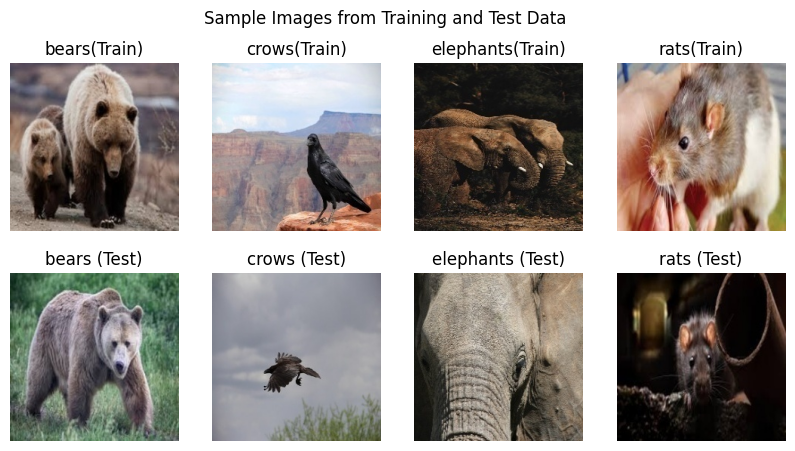

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

base_dir = "/content/drive/MyDrive/DatasetFor9.1/A9.1"
animal_categories = ['bears', 'crows', 'elephants', 'rats']

# Function to display sample images
def display_sample_images(training_dir, test_dir, title):
    plt.figure(figsize=(10, 5))

    # Plotting training images
    for i, category in enumerate(animal_categories):
        plt.subplot(2, 4, i + 1)
        category_dir = os.path.join(training_dir, category)
        image_files = os.listdir(category_dir)
        sample_image = random.choice(image_files)
        img = mpimg.imread(os.path.join(category_dir, sample_image))
        plt.imshow(img)
        plt.title(category + '(Train)')
        plt.axis('off')

    # Plotting test images
    for i, category in enumerate(animal_categories):
        plt.subplot(2, 4, i + 5)
        category_dir = os.path.join(test_dir, category)
        image_files = os.listdir(category_dir)
        sample_image = random.choice(image_files)
        img = mpimg.imread(os.path.join(category_dir, sample_image))
        plt.imshow(img)
        plt.title(category + ' (Test)')
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Sample images from Training and Test data
display_sample_images(
    os.path.join(base_dir, 'Training'),
    os.path.join(base_dir, 'Testing'),
    'Sample Images from Training and Test Data'
)

### **Checking the images that can be found in Training folder and Testing folder of my dataset**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 32
img_w = 224
img_h = 224

train_dir = '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training'
test_dir = '/content/drive/MyDrive/DatasetFor9.1/A9.1/Testing'

# Data augmentation for training data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_h, img_w),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    test_dir,
    target_size=(img_h, img_w),
    batch_size=batch_size,
    class_mode='categorical'
)

Found 1238 images belonging to 4 classes.
Found 326 images belonging to 4 classes.


### **Checking the count of images that can be found in Training folder and Testing folder of my dataset**

In [ ]:
# Checking the count for each animal category in Training Data
print("Training Data: ")
for category, count in train_counts.items():
    print(f"Training {category.lower()} images are: {count}")

# Checking the count for each animal category in Testing Data
print("\nTest Data: ")
for category, count in test_counts.items():
    print(f"Test {category.lower()} images are: {count}")

Training Data: 
Training bears images are: 395
Training crows images are: 231
Training elephants images are: 367
Training rats images are: 245

Test Data: 
Test bears images are: 95
Test crows images are: 72
Test elephants images are: 85
Test rats images are: 74


### **Checking the specific count of animal category per folder that can be found in Training folder and Testing folder of my dataset**

### **Note**: I did not manually divide the data because the dataset owner had already separated it into training and testing sets. Instead, I relied on the owner's partition choice and used it in the model that I am developing. Here are the outcomes based on this approach.

# **Evidences**

### **Create a baseline model of the CNN**

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers


img_h = 224
img_w = 224
batch_size = 32

early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_h, img_w, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(720, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.25),
    Dense(360, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.25),
    Dense(180, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.25),
    Dense(4, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

history = model.fit(train_generator,
                    epochs=10,
                    validation_data=val_generator,
                    callbacks=[early_stopping])
#evaluate
val_loss, val_accuracy = model.evaluate(val_generator)
print("Validation accuracy:", val_accuracy)

Epoch 1/10
39/39 [==============================] - 230s 6s/step - loss: 2.6558 - accuracy: 0.3005 - val_loss: 2.1512 - val_accuracy: 0.2914
Epoch 2/10
39/39 [==============================] - 216s 6s/step - loss: 1.9054 - accuracy: 0.3247 - val_loss: 1.7474 - val_accuracy: 0.3650
Epoch 3/10
39/39 [==============================] - 211s 5s/step - loss: 1.6868 - accuracy: 0.3546 - val_loss: 1.5669 - val_accuracy: 0.3589
Epoch 4/10
39/39 [==============================] - 211s 5s/step - loss: 1.5838 - accuracy: 0.3934 - val_loss: 1.4138 - val_accuracy: 0.5583
Epoch 5/10
39/39 [==============================] - 211s 5s/step - loss: 1.4838 - accuracy: 0.4935 - val_loss: 1.2679 - val_accuracy: 0.5951
Epoch 6/10
39/39 [==============================] - 212s 5s/step - loss: 1.3961 - accuracy: 0.5517 - val_loss: 1.1602 - val_accuracy: 0.7086
Epoch 7/10
39/39 [==============================] - 210s 5s/step - loss: 1.3217 - accuracy: 0.6147 - val_loss: 1.1037 - val_accuracy: 0.7362
Epoch 8/10
39

### **Perform Image Augmentation**

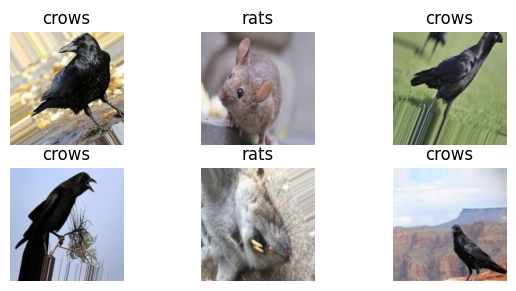

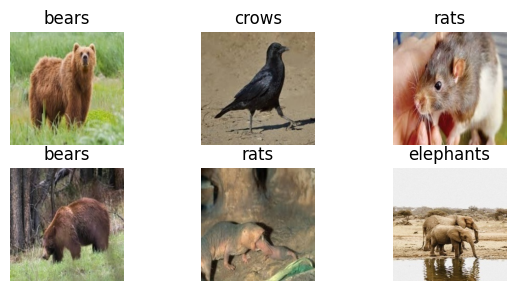

In [ ]:
import matplotlib.pyplot as plt

animal_categories = train_generator.class_indices

#images from generator
def plot_images(generator, num_images=6):
    plt.figure(figsize=(7, 5))
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]
        plt.subplot(3, 3, i+1)
        plt.imshow(image)
        plt.title(label)
        plt.axis('off')
    plt.show()

#training images with labels
plot_images(train_generator)

#validation images with labels
plot_images(val_generator)

### **This base code will be used to augment the images in my dataset using random rotation, flips,shifts, and the ZCA whitening**

### **Perform Feature Standardization**

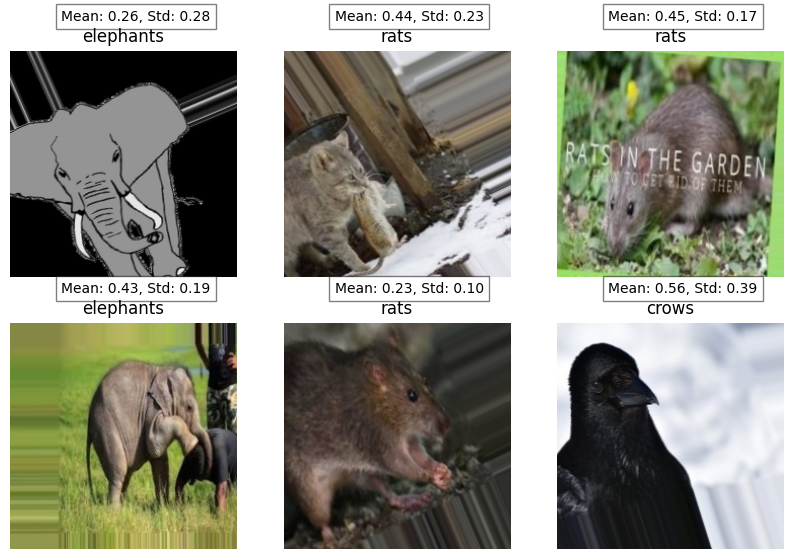

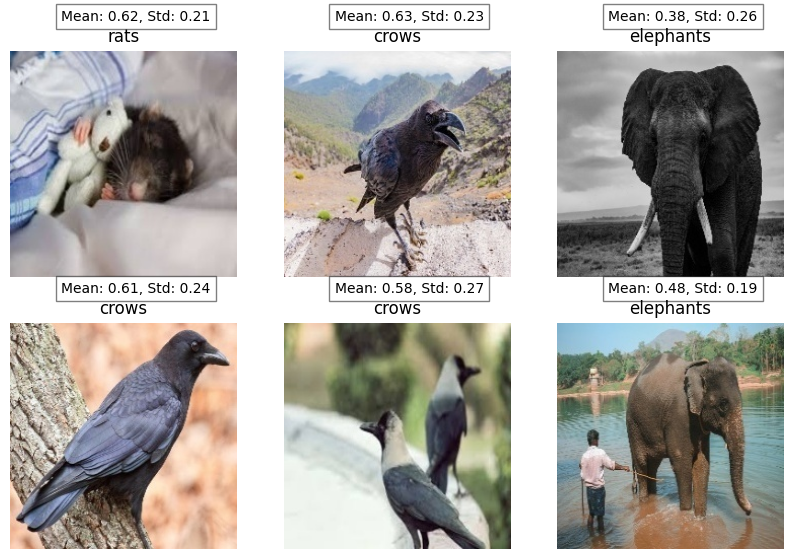

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

animal_categories = train_generator.class_indices

#images from generator
def plot_images(generator, num_images=6):
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]
        mean_pixel_value = np.mean(batch[0][0])
        std_pixel_value = np.std(batch[0][0])
        plt.subplot(3, 3, i+1)
        plt.imshow(image)
        plt.title(label)
        plt.text(50, -30, f"Mean: {mean_pixel_value:.2f}, Std: {std_pixel_value:.2f}", fontsize=10, color='black', bbox=dict(facecolor='white', alpha=0.5))
        plt.axis('off')
    plt.show()

plot_images(train_generator)
plot_images(val_generator)

### **This is for standardizing the image generated from my dataset and we can see the mean and standard deviation of it.**

### **Perform ZCA Whitening on Images**

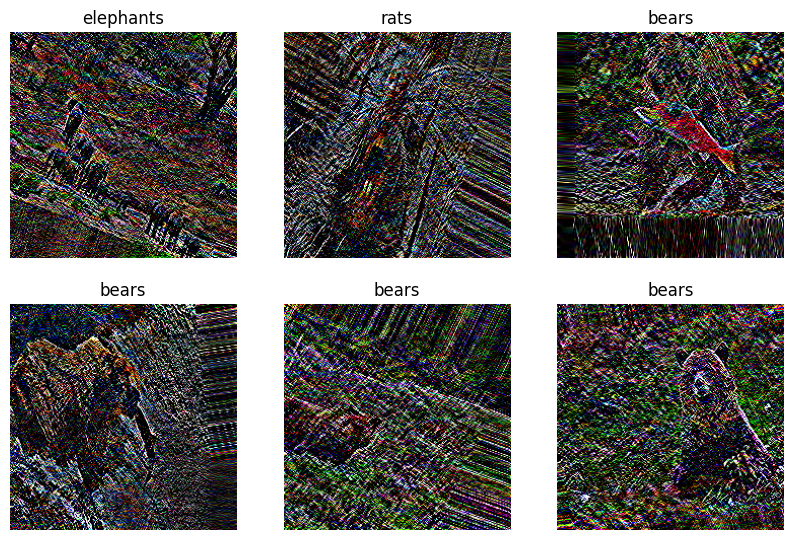

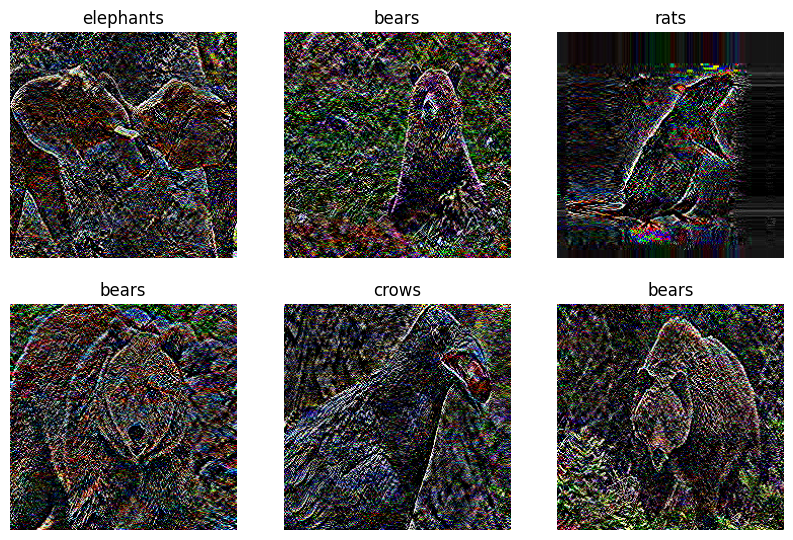

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

animal_categories = train_generator.class_indices

def zca_whitening(images):

    images_flat = images.reshape(images.shape[0], -1)

    cov_matrix = np.dot(images_flat.T, images_flat) / images_flat.shape[0]
    U, S, V = np.linalg.svd(cov_matrix)

    epsilon = 1e-5
    zca_matrix = np.dot(U, np.dot(np.diag(1.0 / np.sqrt(S + epsilon)), U.T))

    #ZCA whitening
    whitened_images_flat = np.dot(images_flat, zca_matrix.T)
    whitened_images = whitened_images_flat.reshape(images.shape)

    return whitened_images

def plot_images_with_whitening(generator, num_images=6):
    plt.figure(figsize=(10, 10))
    num_rows = num_images // 3 + 1
    for i in range(num_images):
        batch = generator.next()
        images = batch[0]
        labels = batch[1]
        for j in range(images.shape[0]):
            if i * num_images + j >= num_images:
                break
            image = images[j]
            label_index = labels[j].argmax()
            label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]

            #standardize image
            mean_pixel_value = np.mean(image)
            std_pixel_value = np.std(image)
            standardized_image = (image - mean_pixel_value) / std_pixel_value

            #apply ZCA whitening to standardized image
            whitened_image = zca_whitening(standardized_image)

            #clip pixel values to valid range
            whitened_image = np.clip(whitened_image, 0, 1)

            plt.subplot(num_rows, 3, i * 3 + j + 1)
            plt.imshow(whitened_image)
            plt.title(label)
            plt.axis('off')
    plt.show()

plot_images_with_whitening(train_generator)
plot_images_with_whitening(val_generator)

### **It transforms the data such that the covariance matrix will be the identity matrix which results to decorrelated features like this.**

### **Augmenting Data with Random Rotations**

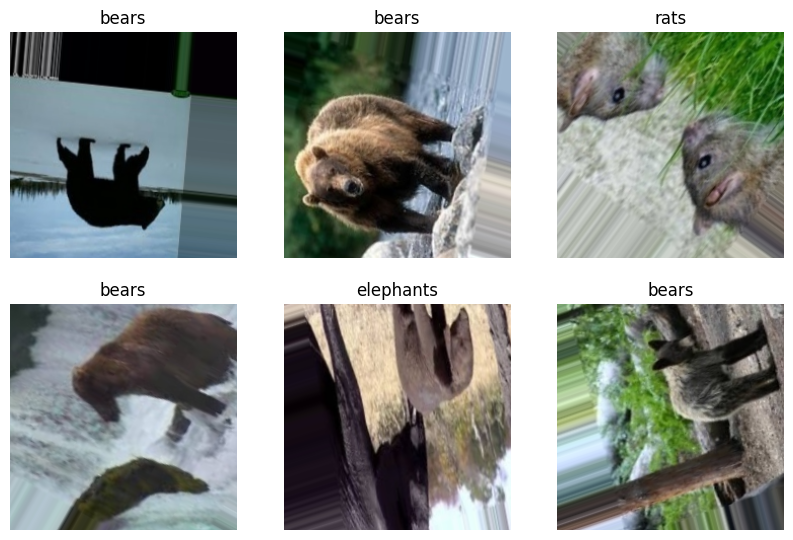

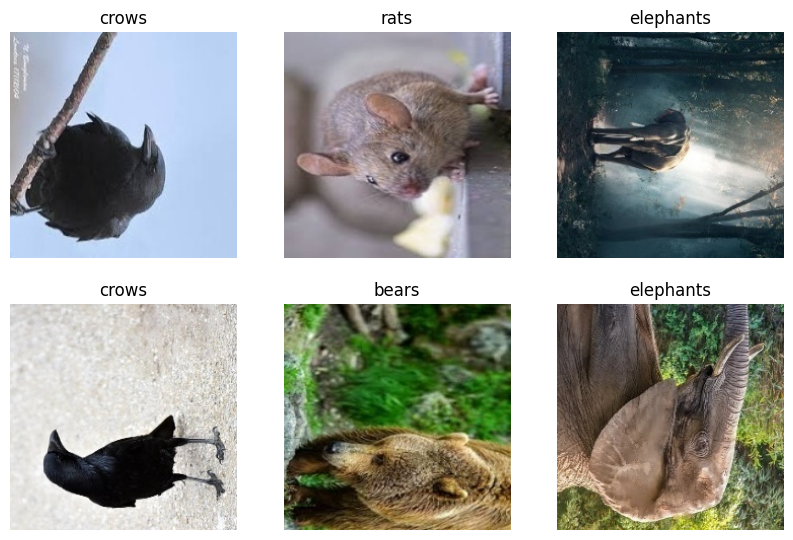

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

categories = train_generator.class_indices

def plotting_random_rotation(generator, num_images=6, rotation_range=40):
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(categories.keys())[list(categories.values()).index(label_index)]
        mean_pixel_value = np.mean(batch[0][0])
        std_pixel_value = np.std(batch[0][0])

        #apply rotation
        rotated_image = np.rot90(image, k=np.random.randint(1, 4))

        plt.subplot(3, 3, i+1)
        plt.imshow(rotated_image)
        plt.title(label)
        plt.axis('off')
    plt.show()

plotting_random_rotation(train_generator)
plotting_random_rotation(val_generator)

#### Augmented through random rotation

### **Augmenting Data with Random Shifts**

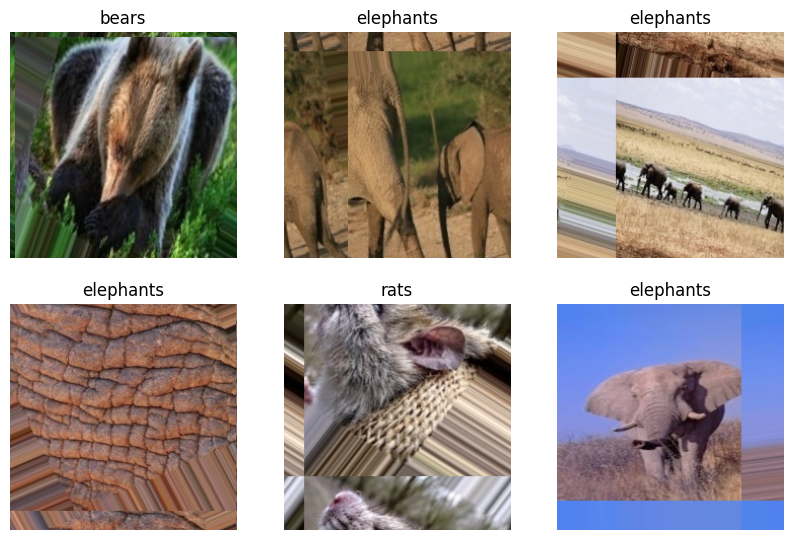

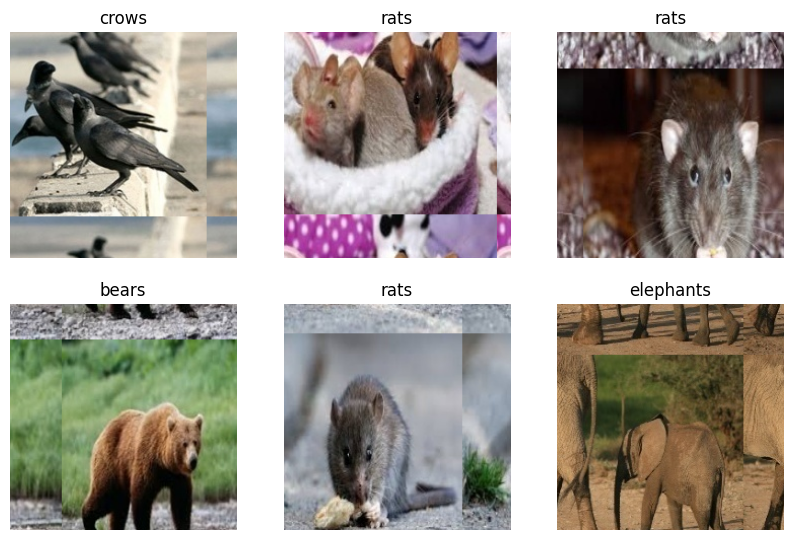

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

animal_categories = train_generator.class_indices

#images from generator with random shifts
def plotting_random_shifts(generator, num_images=6, width_shift_range=0.3, height_shift_range=0.3):
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]
        mean_pixel_value = np.mean(batch[0][0])
        std_pixel_value = np.std(batch[0][0])

        #apply random shifts to the displayed image
        shift_x = np.random.uniform(-width_shift_range, width_shift_range) * image.shape[1]
        shift_y = np.random.uniform(-height_shift_range, height_shift_range) * image.shape[0]
        shifted_image = np.roll(image, int(shift_x), axis=1)
        shifted_image = np.roll(shifted_image, int(shift_y), axis=0)

        plt.subplot(3, 3, i+1)
        plt.imshow(shifted_image)
        plt.title(label)
        plt.axis('off')
    plt.show()

plotting_random_shifts(train_generator)
plotting_random_shifts(val_generator)

#### Augmented through random shifts

### **Augmenting Data with Random Flips**

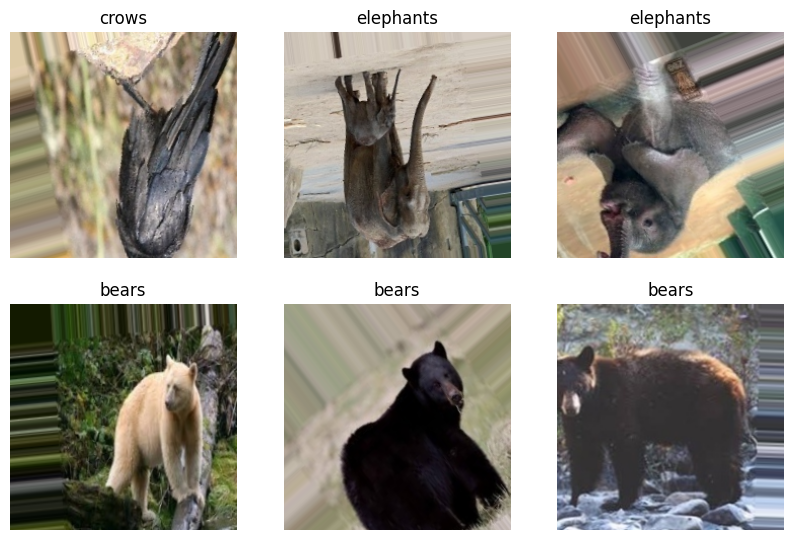

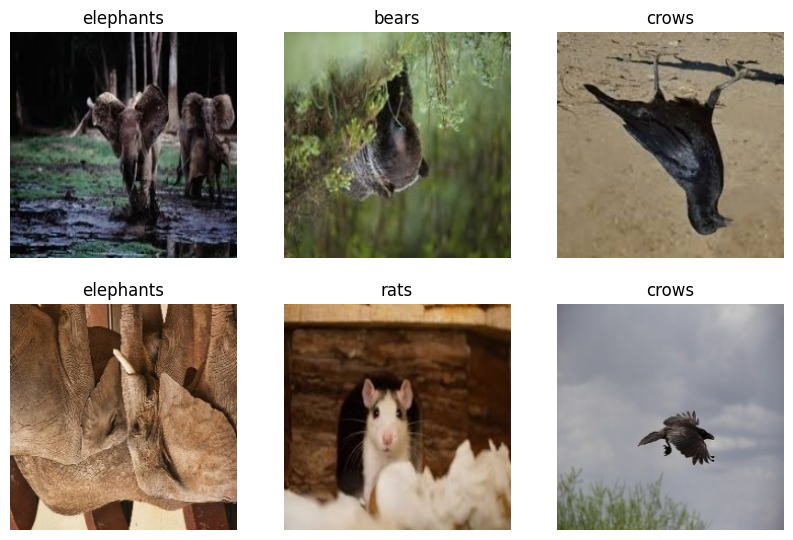

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

animal_categories = train_generator.class_indices

def plotting_random_flips(generator, num_images=6):
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]
        mean_pixel_value = np.mean(batch[0][0])
        std_pixel_value = np.std(batch[0][0])

        #random flips to the displayed image
        flipped_image = np.fliplr(image) if np.random.rand() < 0.5 else np.flipud(image)

        plt.subplot(3, 3, i+1)
        plt.imshow(flipped_image)
        plt.title(label)
        plt.axis('off')
    plt.show()

plotting_random_flips(train_generator)
plotting_random_flips(val_generator)

#### Augmented through random flips

### **Saving Augmented Image Data to Disk**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Function to save augmented images
def save_augmented_image(image, label, operation, index, output_dir):
    filename = f"{label}_{operation}_{index}.png"
    filepath = os.path.join(output_dir, filename)
    plt.imsave(filepath, image)

# Function for plotting and saving augmented images with random shifts
def plotting_random_shifts(generator, output_dir, num_images=6, width_shift_range=0.3, height_shift_range=0.3):
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]

        # Apply random shifts to the displayed image
        shift_x = np.random.uniform(-width_shift_range, width_shift_range) * image.shape[1]
        shift_y = np.random.uniform(-height_shift_range, height_shift_range) * image.shape[0]
        shifted_image = np.roll(image, int(shift_x), axis=1)
        shifted_image = np.roll(shifted_image, int(shift_y), axis=0)

        # Save augmented image
        save_augmented_image(shifted_image, label, "shift", i, output_dir)

# Function for plotting and saving augmented images with random rotations
def plotting_random_rotation(generator, output_dir, num_images=6, rotation_range=40):
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(categories.keys())[list(categories.values()).index(label_index)]

        # Apply rotation
        rotated_image = np.rot90(image, k=np.random.randint(1, 4))

        # Save augmented image
        save_augmented_image(rotated_image, label, "rotation", i, output_dir)

# Function for plotting and saving augmented images with random flips
def plotting_random_flips(generator, output_dir, num_images=6):
    for i in range(num_images):
        batch = generator.next()
        image = batch[0][0]
        label_index = batch[1][0].argmax()
        label = list(animal_categories.keys())[list(animal_categories.values()).index(label_index)]

        # Random flips to the displayed image
        flipped_image = np.fliplr(image) if np.random.rand() < 0.5 else np.flipud(image)

        # Save augmented image
        save_augmented_image(flipped_image, label, "flip", i, output_dir)

output_dir = "saved_augmented_images"

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Calling the functions to plot and save augmented images
plotting_random_shifts(train_generator, output_dir)
plotting_random_shifts(val_generator, output_dir)

plotting_random_rotation(train_generator, output_dir)
plotting_random_rotation(val_generator, output_dir)

plotting_random_flips(train_generator, output_dir)
plotting_random_flips(val_generator, output_dir)


**Proof of saving into disk:**

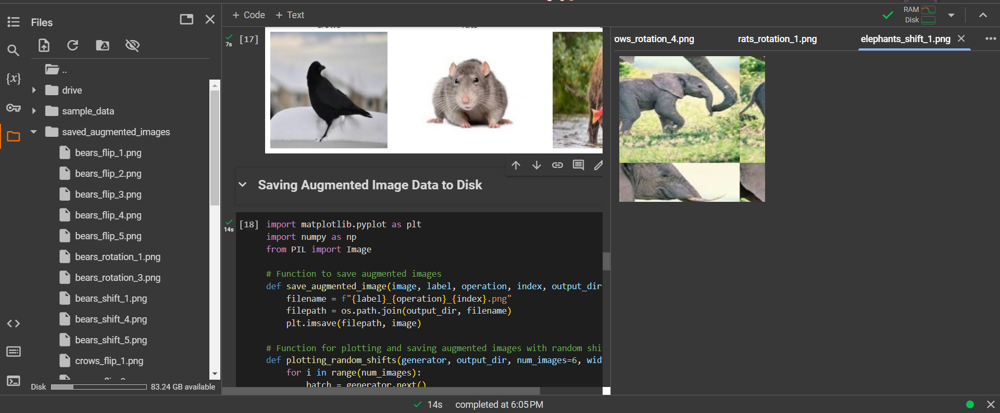

## **Develop a test harness to develop a robust evaluation of a model and establish a baseline of performance for a classification task** AND **Explore extensions to a baseline model to improve learning and model capacity**

Found 1238 images belonging to 4 classes.
Found 326 images belonging to 4 classes.
Epoch 1/10
39/39 [==============================] - 333s 8s/step - loss: 2.5152 - accuracy: 0.2916 - val_loss: 2.1161 - val_accuracy: 0.2914
Epoch 2/10
39/39 [==============================] - 180s 5s/step - loss: 1.8996 - accuracy: 0.3126 - val_loss: 1.7691 - val_accuracy: 0.3804
Epoch 3/10
39/39 [==============================] - 179s 5s/step - loss: 1.6735 - accuracy: 0.3764 - val_loss: 1.5865 - val_accuracy: 0.3742
Epoch 4/10
39/39 [==============================] - 179s 5s/step - loss: 1.5392 - accuracy: 0.4556 - val_loss: 1.5133 - val_accuracy: 0.4417
Epoch 5/10
39/39 [==============================] - 178s 5s/step - loss: 1.3723 - accuracy: 0.5816 - val_loss: 1.0485 - val_accuracy: 0.7914
Epoch 6/10
39/39 [==============================] - 177s 5s/step - loss: 1.1776 - accuracy: 0.7407 - val_loss: 0.8408 - val_accuracy: 0.9264
Epoch 7/10
39/39 [==============================] - 167s 4s/step - loss

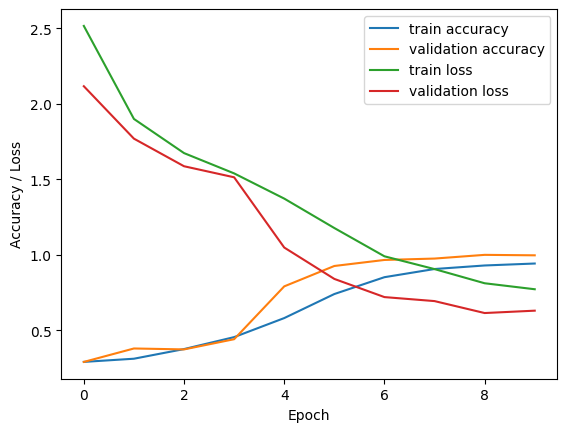

Total time taken: 2293.4321627616882 seconds


In [ ]:
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.callbacks import EarlyStopping
from keras import regularizers
import matplotlib.pyplot as plt
import time

img_h = 224
img_w = 224
batch_size = 32

# Function to load dataset
def load_dataset(train_dir, test_dir):
    train_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(img_h, img_w),
        batch_size=batch_size,
        class_mode='categorical'
    )

    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_h, img_w),
        batch_size=batch_size,
        class_mode='categorical'
    )

    return train_generator, test_generator

early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_h, img_w, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.5),
    Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.5),
    Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    Dropout(0.5),
    Dense(4, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Function to prepare pixel data
def prep_pixels(trainX, testX):
    trainX = trainX.astype('float32') / 255.0
    testX = testX.astype('float32') / 255.0
    return trainX, testX

# Function to evaluate model
def evaluate_model(model, train_generator, test_generator):
    early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
    history = model.fit(train_generator, epochs=10, validation_data=test_generator, callbacks=[early_stopping])
    _, test_acc = model.evaluate(test_generator)
    print('Test accuracy:', test_acc)
    return history

# Function to summarize diagnostics
def summarize_diagnostics(history):
    plt.plot(history.history['accuracy'], label='train accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy / Loss')
    plt.legend()
    plt.show()

# Function to summarize performance
def summarize_performance(scores):
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (np.mean(scores), np.std(scores), len(scores)))

# Entry point, run the test harness
def run_test_harness(train_dir, test_dir):
    start_time = time.time()
    # Load dataset
    train_generator, test_generator = load_dataset(train_dir, test_dir)
    # Evaluate model
    history = evaluate_model(model, train_generator, test_generator)
    # Summarize diagnostics
    summarize_diagnostics(history)
    end_time = time.time()
    total_time = end_time - start_time
    print("Total time taken:", total_time, "seconds")

train_dir = '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training'
test_dir = '/content/drive/MyDrive/DatasetFor9.1/A9.1/Testing'

# Run the test harness
run_test_harness(train_dir, test_dir)


# **Note:** I combined the task 7 and 8 for this part since I am adjusting neurons to make the model better and use test harness at the same time.

### **Evaluation:** In here, I increased the depth of the convolutional layers to capture the other complex patterns in my dataset, I increased the number of epochs from 10 to 20 for my model to train enough since my dataset and network is a little bit complex. Lastly, I added some L2 regularization technique on the dense layers and dropout layers to further prevent and reduce overfitting. Using these techniques, I managed to improve my model having accuracy of 75% to 78%.

### **Develop a finalized model, evaluate the performance of the final model, and use it to make predictions on new images**

## **Note:** Since my model is accurate enough, I will use it as my finalized model.

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

# Save model
model.save("/content/my_final_model")

# Load model
loaded_model = tf.keras.models.load_model("/content/my_final_model")

# Function to preprocess a single image
def preprocess_image(image_path, target_size=(224, 224)):
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.resize(img, target_size)
    img_flat = img.reshape(1, -1)
    return img, img_flat

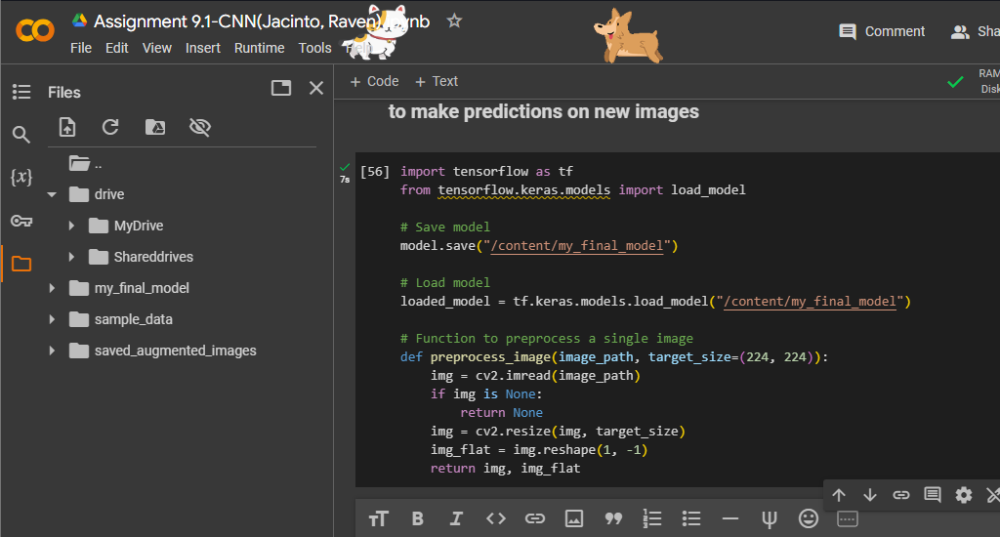

Testing IMG for category: bears
1/1 [==============================] - 0s 106ms/step


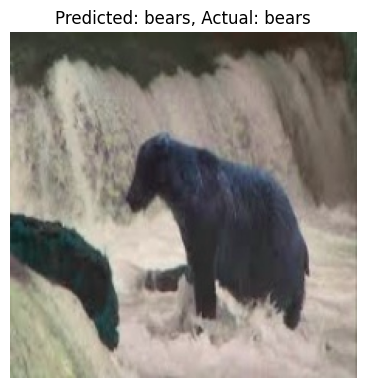

Testing IMG for category: crows
1/1 [==============================] - 0s 147ms/step


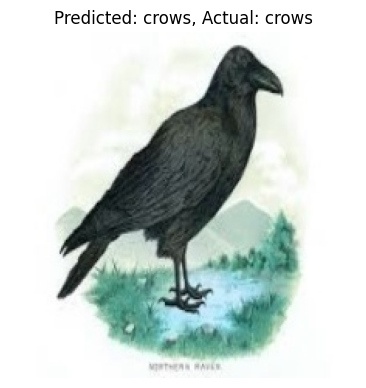

Testing IMG for category: elephants
1/1 [==============================] - 0s 83ms/step


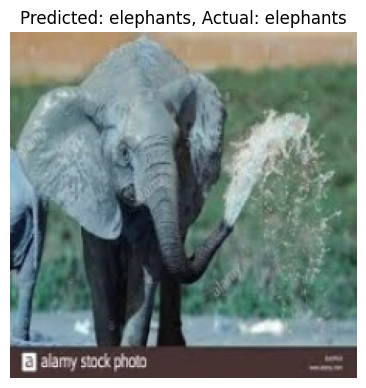

Testing IMG for category: rats
1/1 [==============================] - 0s 88ms/step


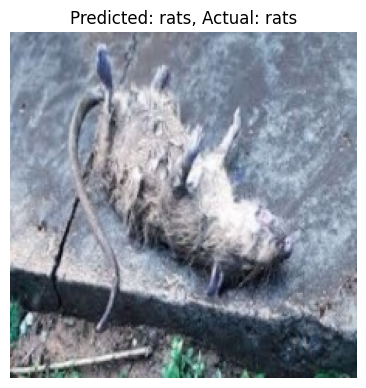

In [ ]:
import cv2

def preprocess_image(image_path):
    # Load the image using OpenCV
    img = cv2.imread(image_path)

    if img is None:
        return None, None

    # Resize the image to match the model's input shape
    img_resized = cv2.resize(img, (224, 224))

    # Expand dimensions to create a batch of 1
    img_expanded = img_resized[np.newaxis, ...]

    return img_resized, img_expanded

# Test a sample image for each category
sample_image_paths = {
    'bears': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training/bears/images (8).jpeg',
    'crows': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training/crows/9k_.jpeg',
    'elephants': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training/elephants/9k_.jpeg',
    'rats': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training/rats/G1 (84).jpeg'
}


for cls, image_path in sample_image_paths.items():
    print(f"Testing IMG for category: {cls}")
    img, img_expanded = preprocess_image(image_path)
    if img is None:
        print(f"Unable to load image: {image_path}")
        continue

    # Make predictions
    predicted_class = loaded_model.predict(img_expanded)[0]
    predicted_class_scalar = np.argmax(predicted_class)  # Extract the integer scalar

    class_names = sorted(os.listdir(train_dir))
    num_classes = len(class_names)

    # Display image with predicted and actual labels
    plt.figure(figsize=(4.5, 4.5))
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[predicted_class_scalar]}, Actual: {cls}")  # Use the extracted scalar
    plt.axis('off')
    plt.show()

Testing IMG for category: bears
1/1 [==============================] - 0s 104ms/step


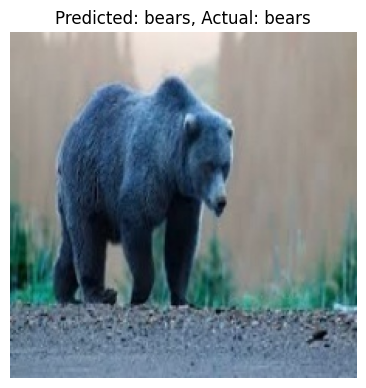

Testing IMG for category: crows
1/1 [==============================] - 0s 62ms/step


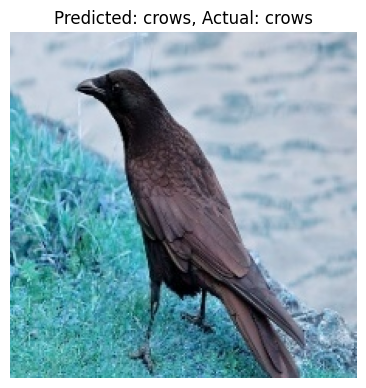

Testing IMG for category: elephants
1/1 [==============================] - 0s 57ms/step


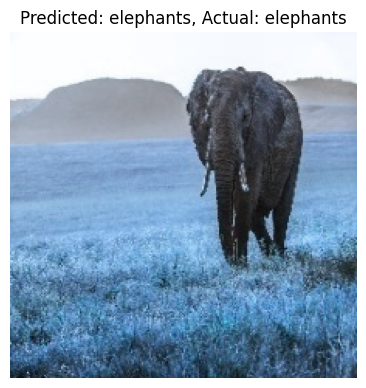

Testing IMG for category: rats
1/1 [==============================] - 0s 89ms/step


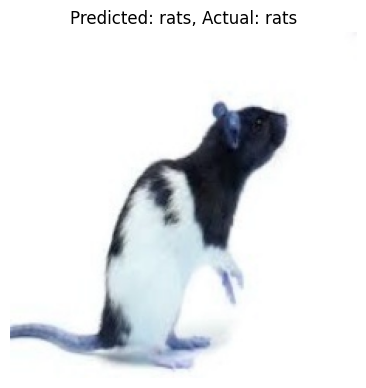

In [ ]:
# 2nd test
import cv2

def preprocess_image(image_path):
    # Load the image using OpenCV
    img = cv2.imread(image_path)

    if img is None:
        return None, None

    # Resize the image to match the model's input shape
    img_resized = cv2.resize(img, (224, 224))

    # Expand dimensions to create a batch of 1
    img_expanded = img_resized[np.newaxis, ...]

    return img_resized, img_expanded

# Test a sample image for each category
sample_image_paths = {
    'bears': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Training/bears/m6.jpeg',
    'crows': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Testing/crows/Z1  (96).jpg',
    'elephants': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Testing/elephants/photo_1535941339077_2dd1c7963098.jpeg',
    'rats': '/content/drive/MyDrive/DatasetFor9.1/A9.1/Testing/rats/images (74).jpeg',
}


for cls, image_path in sample_image_paths.items():
    print(f"Testing IMG for category: {cls}")
    img, img_expanded = preprocess_image(image_path)
    if img is None:
        print(f"Unable to load image: {image_path}")
        continue

    # Make predictions
    predicted_class = loaded_model.predict(img_expanded)[0]
    predicted_class_scalar = np.argmax(predicted_class)  # Extract the integer scalar

    class_names = sorted(os.listdir(train_dir))
    num_classes = len(class_names)

    # Display image with predicted and actual labels
    plt.figure(figsize=(4.5, 4.5))
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[predicted_class_scalar]}, Actual: {cls}")  # Use the extracted scalar
    plt.axis('off')
    plt.show()

### **Evaluation:** Upon predicting the 4 sample images of each animal category using the improved CNN model, 4 out 4 sample pictures are predicted right. I believe that it is because my model's prediction accuracy is 99%. In addition, I tried some pictures for the same animal category as well, all of them are predicted right maybe because of my small amount of images in dataset. This model satisfies the need for predicting the 4 mentioned animals. This signifies that this CNN model is excellent in predicting animals given in the sample which leads to completeness of the task in this activity.

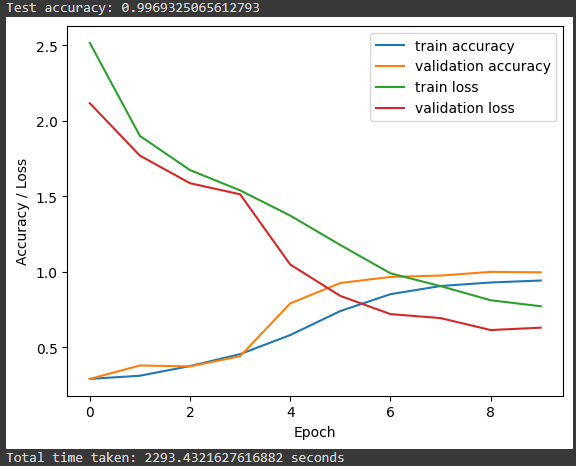

## **Note:** This presents a graph for my model used in this prediction. It indicates that the validation accuracy is close to the train accuracy which means that the model is performing well during the training and testing. The loss graph of the model also gave an excellence in performance since the loss of the validation is slightly lower than the training loss. Which means that the model can predict with an excellent accuracy.

## **Conclusion/Learning:**


### Other than learning technical skills and knowledge about convolutional neural networks, I improved my patience and trust that it will soon be well since training and compiling a model take much time rather than what I have experienced in the past activities. I enjoyed doing this and I also grasped the concepts of how convolutional neural network works, its different layers, and of course how to apply it on my model. This activity is quite challenging for me since I have to deal with image augmentation, which in my case, causes my model to decrease its accuracy. I did some adjustments and techniques to be able to predict correctly using my CNN model. Overall, it is a fun yet challenging activity that certainly enhanced my knowledge in neural networks, especially in managing and developing convolution neural networks.